In [1]:
import numpy as np
import pandas as pd
import scanpy as sc


In [2]:
sc.settings.verbosity = 3             # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_header()
sc.settings.set_figure_params(dpi=80, facecolor='white')

scanpy==1.8.2 anndata==0.7.8 umap==0.5.2 numpy==1.20.3 scipy==1.8.0 pandas==1.4.1 scikit-learn==1.0.2 statsmodels==0.12.2 python-igraph==0.9.9 louvain==0.7.1 pynndescent==0.5.6


In [3]:
S7 = sc.read_10x_mtx('S7/filtered_feature_bc_matrix/',cache=True)  
S8 = sc.read_10x_mtx('S8/filtered_feature_bc_matrix/',cache=True)
S9 = sc.read_10x_mtx('S9/filtered_feature_bc_matrix/',cache=True)
S10 = sc.read_10x_mtx('S10/filtered_feature_bc_matrix/',cache=True)


... reading from cache file cache/S7-filtered_feature_bc_matrix-matrix.h5ad
... reading from cache file cache/S8-filtered_feature_bc_matrix-matrix.h5ad
... reading from cache file cache/S9-filtered_feature_bc_matrix-matrix.h5ad
... reading from cache file cache/S10-filtered_feature_bc_matrix-matrix.h5ad


In [4]:
S7.obs['type'] = 'S7'
S8.obs['type'] = 'S8'
S9.obs['type'] = 'S9'
S10.obs['type'] = 'S10'

In [5]:
S7.obs['sample'] = 'Cre-'
S8.obs['sample'] = 'Cre-'
S9.obs['sample'] = 'Cre+'
S10.obs['sample'] = 'Cre+'

In [6]:
S7.var_names_make_unique()
S8.var_names_make_unique()
S9.var_names_make_unique()
S10.var_names_make_unique()

normalizing counts per cell
    finished (0:00:00)


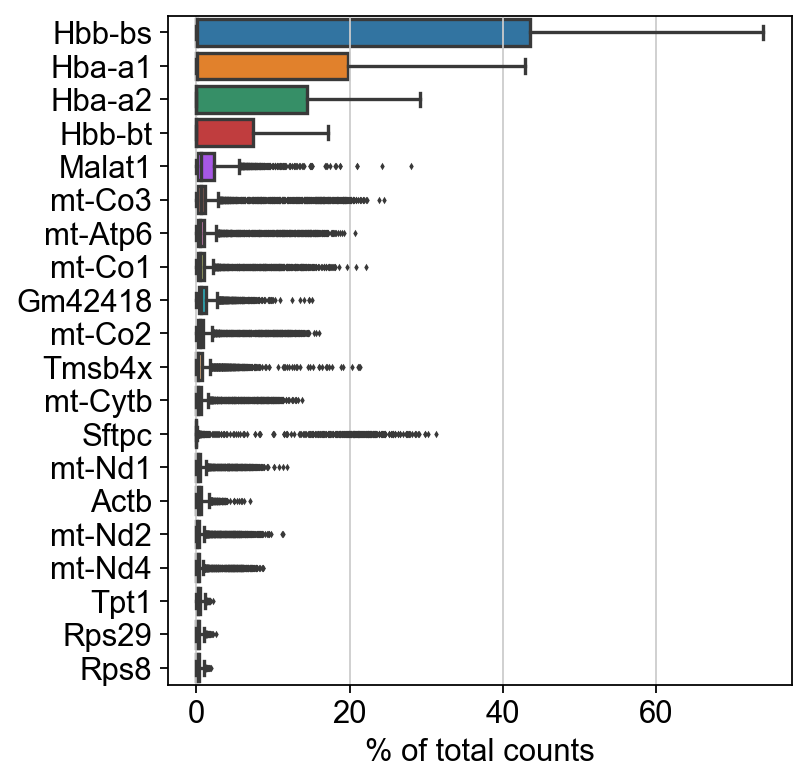

normalizing counts per cell
    finished (0:00:00)


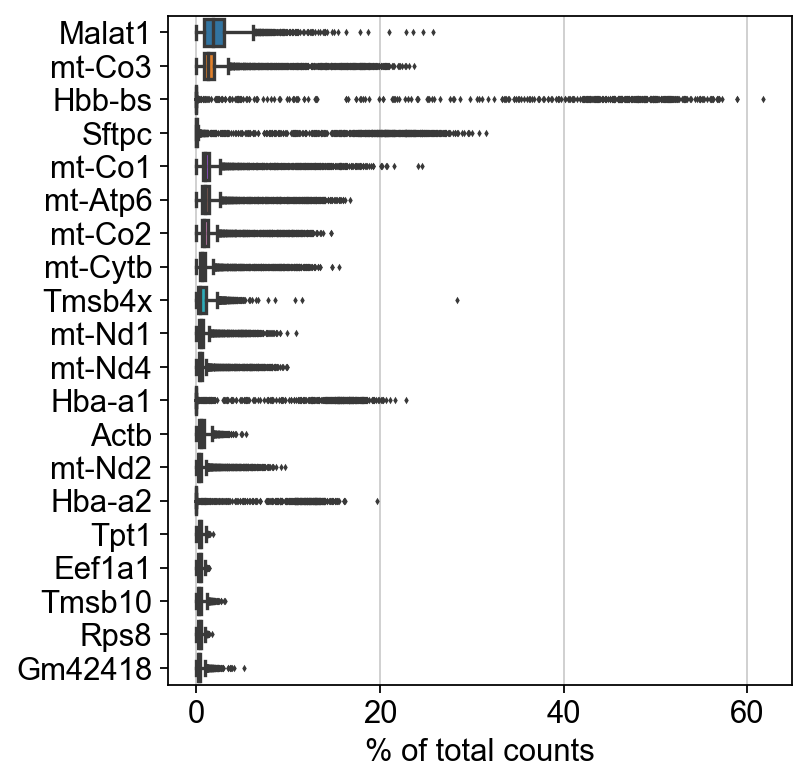

normalizing counts per cell
    finished (0:00:00)


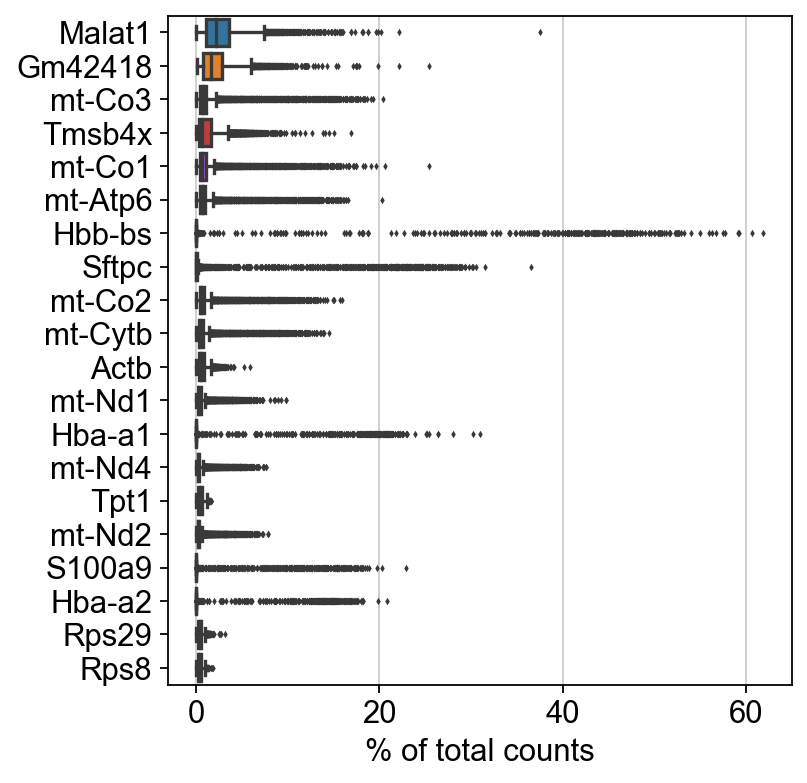

normalizing counts per cell
    finished (0:00:00)


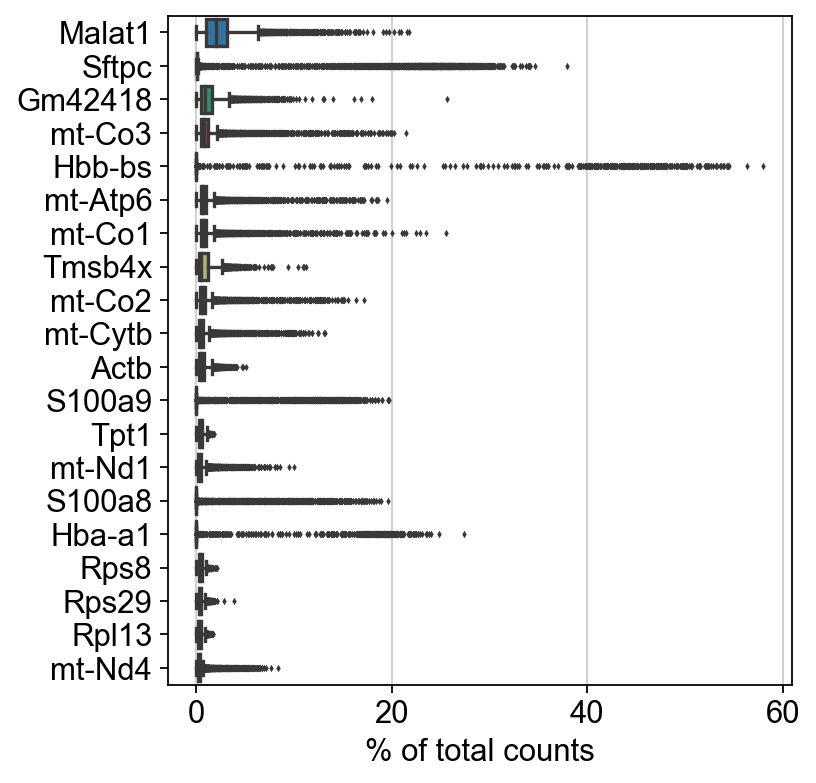

In [7]:
sc.pl.highest_expr_genes(S7, n_top=20, )
sc.pl.highest_expr_genes(S8, n_top=20, )
sc.pl.highest_expr_genes(S9, n_top=20, )
sc.pl.highest_expr_genes(S10, n_top=20, )




In [8]:
sc.pp.filter_cells(S7, min_genes=200)
sc.pp.filter_genes(S7, min_cells=3)
sc.pp.filter_cells(S8, min_genes=200)
sc.pp.filter_genes(S8, min_cells=3)
sc.pp.filter_cells(S9, min_genes=200)
sc.pp.filter_genes(S9, min_cells=3)
sc.pp.filter_cells(S10, min_genes=200)
sc.pp.filter_genes(S10, min_cells=3)

filtered out 2923 cells that have less than 200 genes expressed
filtered out 13159 genes that are detected in less than 3 cells
filtered out 400 cells that have less than 200 genes expressed
filtered out 12845 genes that are detected in less than 3 cells
filtered out 261 cells that have less than 200 genes expressed
filtered out 12304 genes that are detected in less than 3 cells
filtered out 297 cells that have less than 200 genes expressed
filtered out 12067 genes that are detected in less than 3 cells


In [9]:
adata = S7.concatenate(S8,S9,S10)

In [10]:
print(adata.obs['sample'].value_counts())

Cre+    20521
Cre-    14336
Name: sample, dtype: int64


In [11]:
# mitochondrial genes
adata.var['mt'] = adata.var_names.str.startswith('mt-') 
# ribosomal genes
adata.var['ribo'] = adata.var_names.str.startswith(("Rps","Rpl"))
# hemoglobin genes.
adata.var['hb'] = adata.var_names.str.contains(("^Hb[^(p)]"))

adata.var


,gene_ids,feature_types,n_cells-0,n_cells-1,n_cells-2,n_cells-3,mt,ribo,hb
Xkr4,ENSMUSG00000051951,Gene Expression,40,53,47,81,False,False,False
Gm19938,ENSMUSG00000102331,Gene Expression,83,126,70,77,False,False,False
Rp1,ENSMUSG00000025900,Gene Expression,37,32,56,63,False,False,False
Sox17,ENSMUSG00000025902,Gene Expression,1471,1408,1804,2236,False,False,False
Gm37587,ENSMUSG00000104238,Gene Expression,69,57,61,67,False,False,False
...,...,...,...,...,...,...,...,...,...
Vamp7,ENSMUSG00000051412,Gene Expression,919,1395,1351,1940,False,False,False
Spry3,ENSMUSG00000061654,Gene Expression,7,14,10,7,False,False,False
Tmlhe,ENSMUSG00000079834,Gene Expression,144,104,200,219,False,False,False
CAAA01147332.1,ENSMUSG00000095742,Gene Expression,279,411,610,487,False,False,False


In [12]:
#adata.var.to_csv('check.csv')

In [13]:
adata

AnnData object with n_obs × n_vars = 34857 × 18285
    obs: 'type', 'sample', 'n_genes', 'batch'
    var: 'gene_ids', 'feature_types', 'n_cells-0', 'n_cells-1', 'n_cells-2', 'n_cells-3', 'mt', 'ribo', 'hb'

In [14]:
sc.pp.calculate_qc_metrics(adata,qc_vars=['mt','ribo','hb'],percent_top=None,log1p=False,inplace=True)

In [15]:
mito_genes = adata.var_names.str.startswith('mt-')
# for each cell compute fraction of counts in mito genes vs. all genes
# the `.A1` is only necessary as X is sparse (to transform to a dense array after summing)
adata.obs['percent_mt2'] = np.sum(
    adata[:, mito_genes].X, axis=1).A1 / np.sum(adata.X, axis=1).A1
# add the total counts per cell as observations-annotation to adata
adata.obs['n_counts'] = adata.X.sum(axis=1).A1

/Users/sshome/opt/anaconda3/lib/python3.9/site-packages/anndata/_core/anndata.py:1228: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Reordering categories will always return a new Categorical object.
  c.reorder_categories(natsorted(c.categories), inplace=True)
... storing 'type' as categorical
/Users/sshome/opt/anaconda3/lib/python3.9/site-packages/anndata/_core/anndata.py:1228: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Reordering categories will always return a new Categorical object.
  c.reorder_categories(natsorted(c.categories), inplace=True)
... storing 'sample' as categorical
/Users/sshome/opt/anaconda3/lib/python3.9/site-packages/anndata/_core/anndata.py:1228: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Reorde

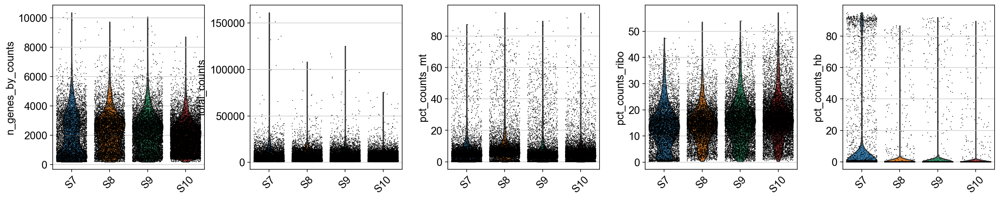

In [16]:
sc.pl.violin(adata, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt','pct_counts_ribo', 'pct_counts_hb'],
             jitter=0.4, groupby = 'type', rotation= 45)

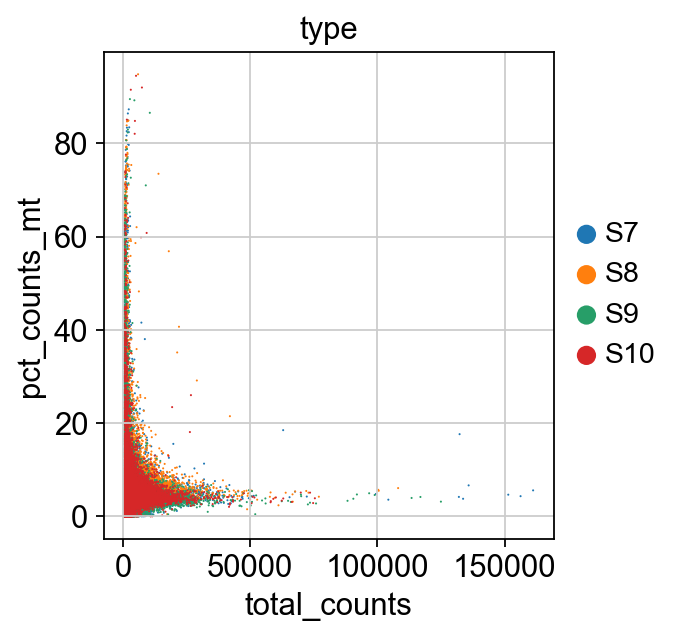

In [17]:
sc.pl.scatter(adata, x='total_counts', y='pct_counts_mt', color="type")

In [18]:
sc.pp.filter_cells(adata, min_genes=200)
sc.pp.filter_genes(adata, min_cells=3)

print(adata.n_obs, adata.n_vars)

34857 18285


normalizing counts per cell
    finished (0:00:00)


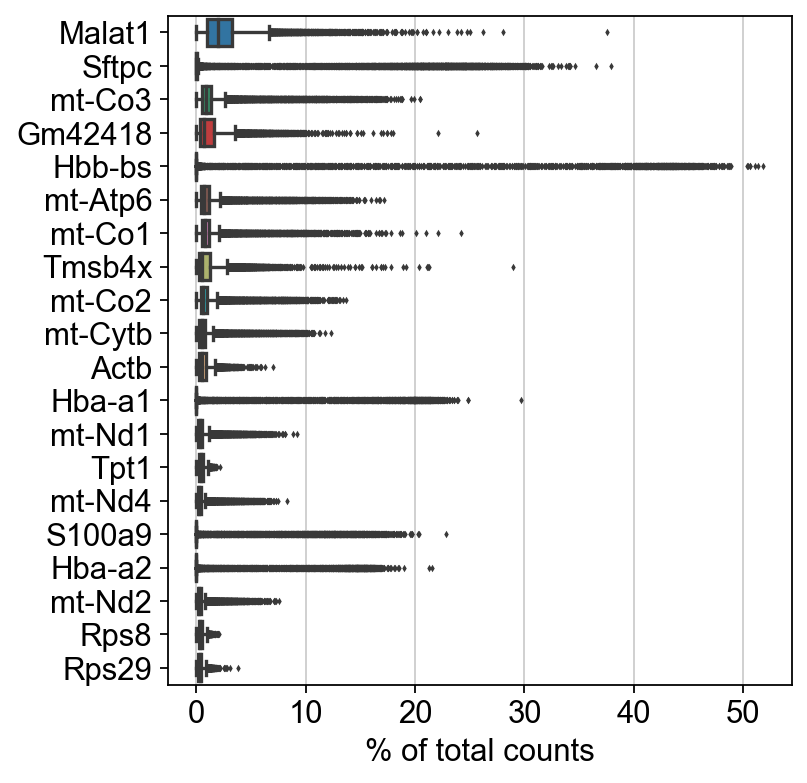

In [19]:
sc.pl.highest_expr_genes(adata, n_top=20)

In [20]:
# filter for percent mito
adata = adata[adata.obs['pct_counts_mt'] < 16, :]

# filter for percent hb > 5
adata = adata[adata.obs['pct_counts_hb'] < 5, :]

# filter for percent ribo > 5
adata = adata[adata.obs['pct_counts_ribo'] > 15, :]

print("Remaining cells %d"%adata.n_obs)



Remaining cells 17157


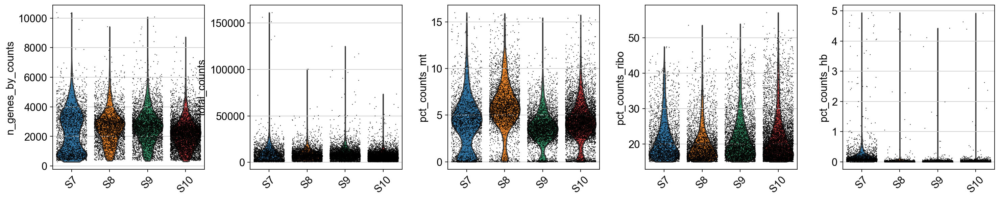

In [21]:
sc.pl.violin(adata, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt','pct_counts_ribo', 'pct_counts_hb'],
             jitter=0.4, groupby = 'type', rotation= 45)

In [22]:
adata

View of AnnData object with n_obs × n_vars = 17157 × 18285
    obs: 'type', 'sample', 'n_genes', 'batch', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'pct_counts_hb', 'percent_mt2', 'n_counts'
    var: 'gene_ids', 'feature_types', 'n_cells-0', 'n_cells-1', 'n_cells-2', 'n_cells-3', 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'n_cells'
    uns: 'type_colors'

In [23]:
malat1 = adata.var_names.str.startswith('Malat1')
# we need to redefine the mito_genes since they were first 
# calculated on the full object before removing low expressed genes.
mito_genes = adata.var_names.str.startswith('mt-')
hb_genes = adata.var_names.str.contains(("^Hb[^(p)]"))
rb_genes = adata.var_names.str.startswith(("Rps","Rpl"))


remove = np.add(mito_genes,malat1)
remove1 = np.add(remove,hb_genes)
remove2 = np.add(remove1,rb_genes)
keep = np.invert(remove2)

adata = adata[:,keep]

print(adata.n_obs, adata.n_vars)

17157 18164


normalizing counts per cell


/Users/sshome/opt/anaconda3/lib/python3.9/site-packages/scanpy/preprocessing/_normalization.py:155: UserWarning: Revieved a view of an AnnData. Making a copy.
  view_to_actual(adata)


    finished (0:00:00)


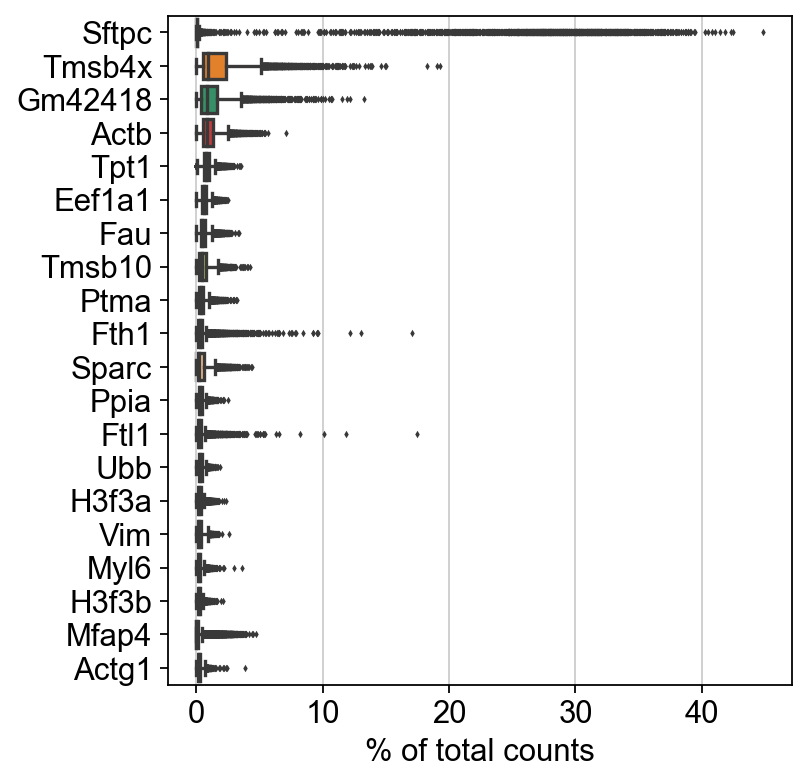

In [24]:
sc.pl.highest_expr_genes(adata, n_top=20)

In [25]:
#pip install pybiomart

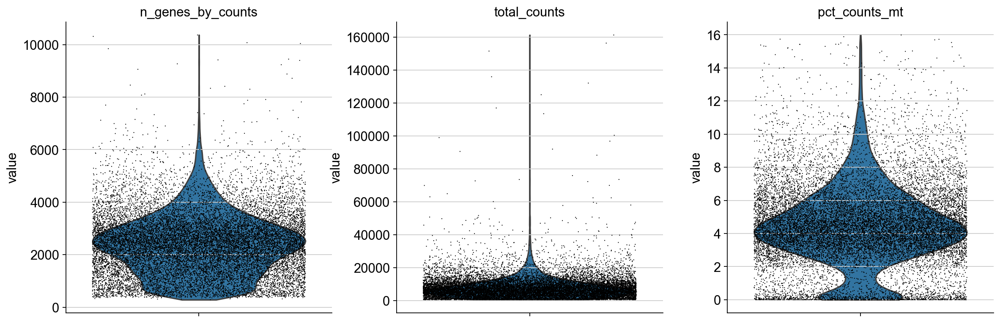

In [26]:
sc.pl.violin(adata,['n_genes_by_counts', 'total_counts', 'pct_counts_mt'],jitter=0.4, multi_panel=True)


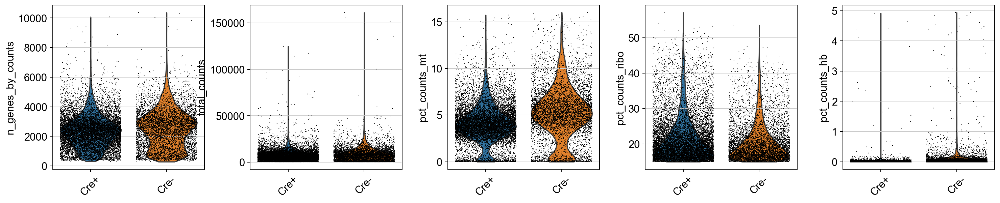

In [27]:
sc.pl.violin(adata, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt','pct_counts_ribo', 'pct_counts_hb'],
             jitter=0.4, groupby = 'sample', rotation= 45)

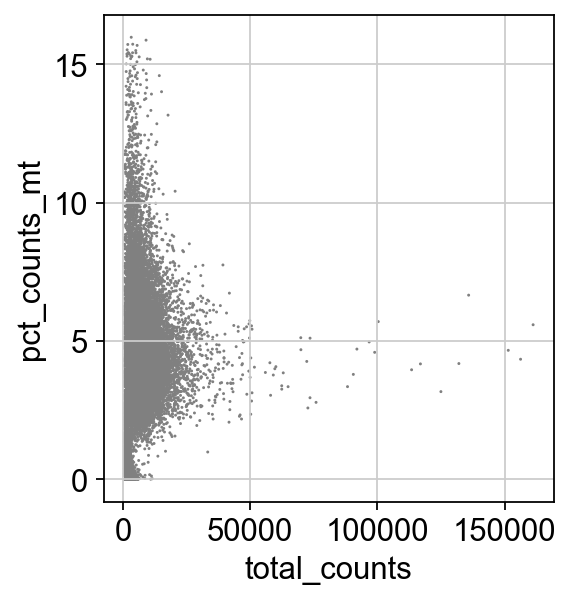

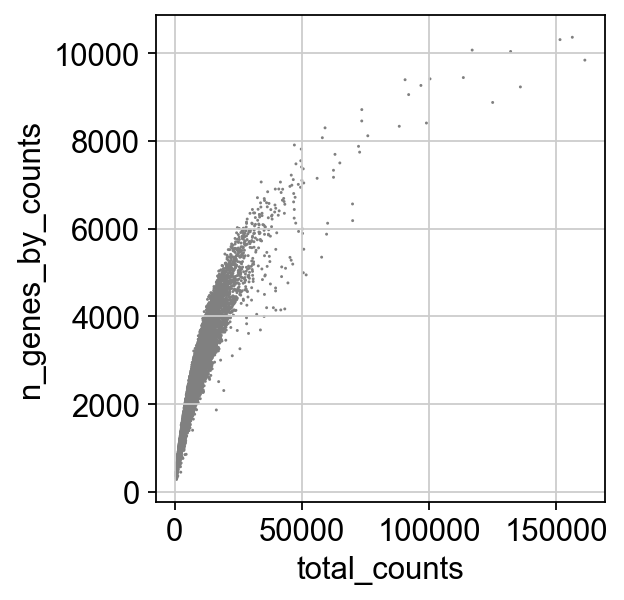

In [28]:
sc.pl.scatter(adata, x='total_counts', y='pct_counts_mt')
sc.pl.scatter(adata, x='total_counts', y='n_genes_by_counts')


In [29]:
adata

AnnData object with n_obs × n_vars = 17157 × 18164
    obs: 'type', 'sample', 'n_genes', 'batch', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'pct_counts_hb', 'percent_mt2', 'n_counts'
    var: 'gene_ids', 'feature_types', 'n_cells-0', 'n_cells-1', 'n_cells-2', 'n_cells-3', 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'n_cells'
    uns: 'type_colors', 'sample_colors'

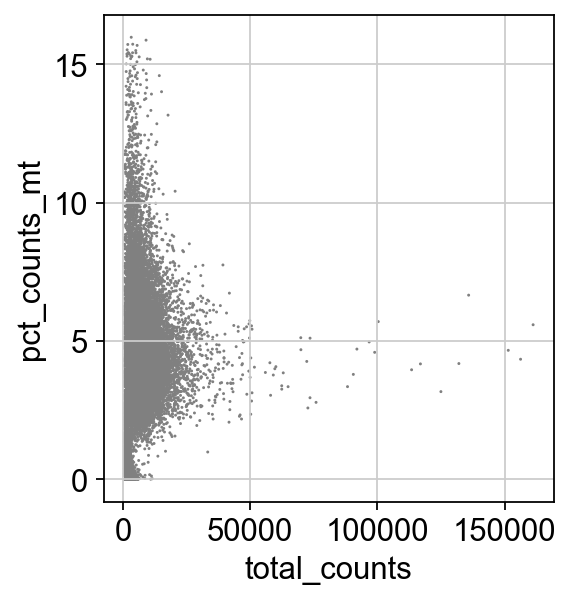

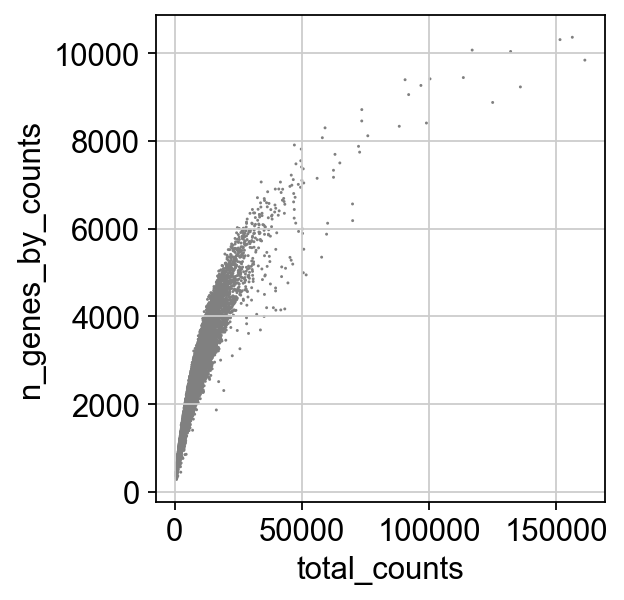

In [30]:
sc.pl.scatter(adata, x='total_counts', y='pct_counts_mt')
sc.pl.scatter(adata, x='total_counts', y='n_genes_by_counts')


In [31]:
sc.pp.normalize_total(adata, target_sum=1e4)


normalizing counts per cell
    finished (0:00:00)


In [32]:
sc.pp.log1p(adata)


In [33]:
sc.pp.highly_variable_genes(adata, min_mean=0.0125, max_mean=3, min_disp=0.5)


extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


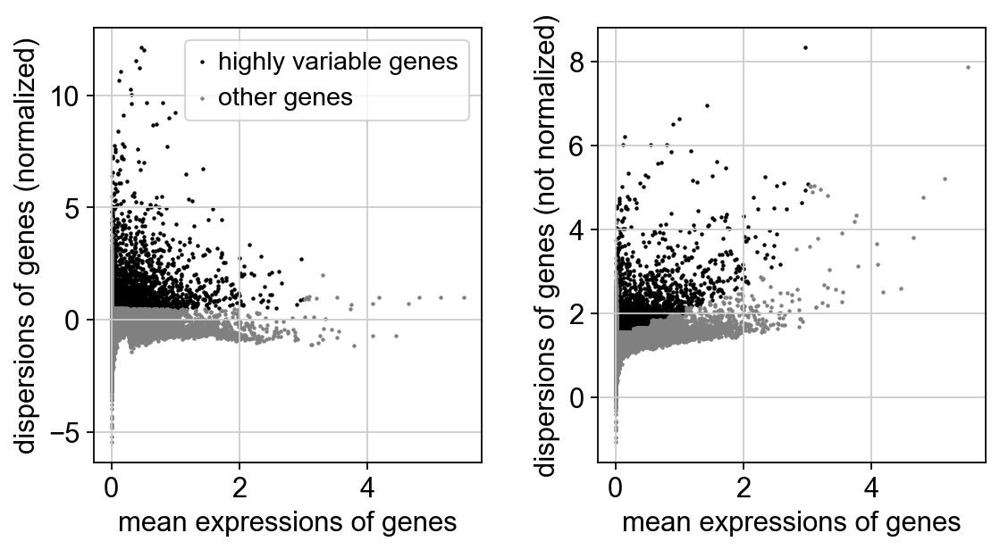

In [34]:
sc.pl.highly_variable_genes(adata)

In [35]:
adata.raw = adata

In [36]:
adata = adata[:, adata.var.highly_variable]

In [37]:
sc.pp.scale(adata, max_value=10)


... as `zero_center=True`, sparse input is densified and may lead to large memory consumption


/Users/sshome/opt/anaconda3/lib/python3.9/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Revieved a view of an AnnData. Making a copy.
  view_to_actual(adata)


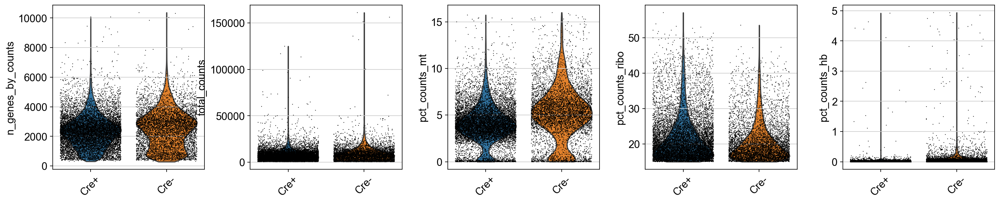

In [38]:
sc.pl.violin(adata, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt','pct_counts_ribo', 'pct_counts_hb'],
             jitter=0.4, groupby = 'sample', rotation= 45)

In [39]:
sc.tl.pca(adata, svd_solver='arpack')

computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:01)


In [40]:
print(adata.obs['sample'].value_counts())

Cre+    11192
Cre-     5965
Name: sample, dtype: int64


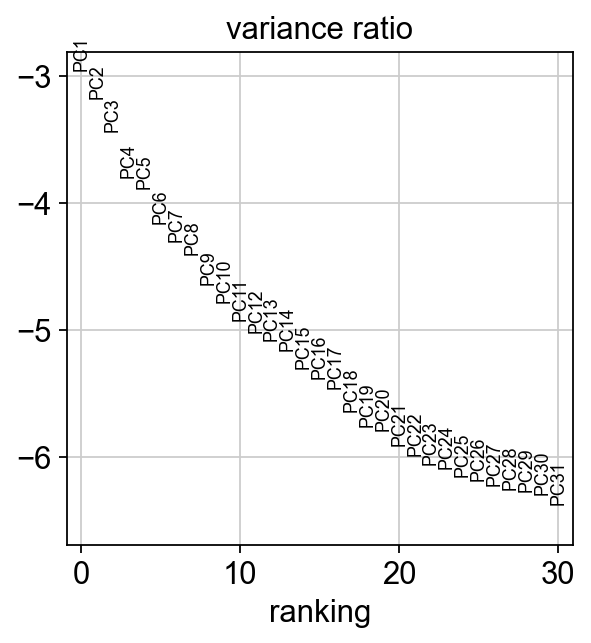

In [41]:
sc.pl.pca_variance_ratio(adata, log=True)

In [42]:
sc.pp.neighbors(adata, n_neighbors=10, n_pcs=40)

computing neighbors
    using 'X_pca' with n_pcs = 40


OMP: Info #271: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.


    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:07)


In [43]:
sc.tl.umap(adata)

computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:11)


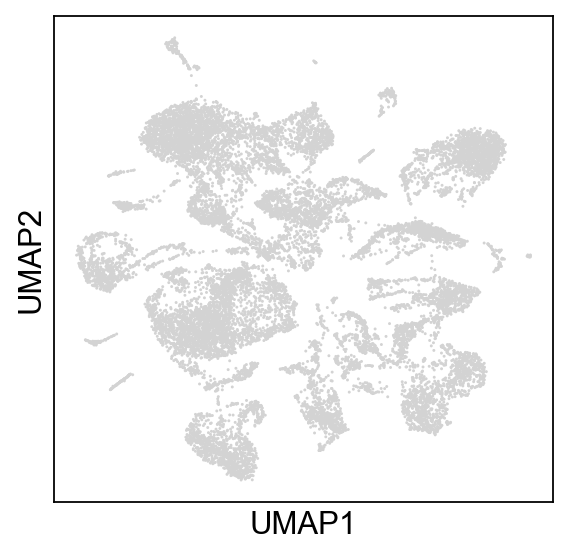

In [44]:
sc.pl.umap(adata)

In [45]:
sc.tl.leiden(adata, key_added = "leiden_1.0") # default resolution in 1.0
sc.tl.leiden(adata, resolution = 0.3, key_added = "leiden_0.3")
sc.tl.leiden(adata, resolution = 0.2, key_added = "leiden_0.2")
sc.tl.leiden(adata, resolution = 0.1, key_added = "leiden_0.1")
sc.tl.leiden(adata, resolution = 0.01, key_added = "leiden_0.01")

running Leiden clustering
    finished: found 48 clusters and added
    'leiden_1.0', the cluster labels (adata.obs, categorical) (0:00:01)
running Leiden clustering
    finished: found 27 clusters and added
    'leiden_0.3', the cluster labels (adata.obs, categorical) (0:00:00)
running Leiden clustering
    finished: found 21 clusters and added
    'leiden_0.2', the cluster labels (adata.obs, categorical) (0:00:01)
running Leiden clustering
    finished: found 18 clusters and added
    'leiden_0.1', the cluster labels (adata.obs, categorical) (0:00:00)
running Leiden clustering
    finished: found 7 clusters and added
    'leiden_0.01', the cluster labels (adata.obs, categorical) (0:00:00)


In [46]:
adata.obsm['leiden_0.3'] = adata.obs['leiden_0.3']
adata.obsm['leiden_0.2'] = adata.obs['leiden_0.2']
adata.obsm['leiden_0.1'] = adata.obs['leiden_0.1']
adata.obsm['leiden_0.01'] = adata.obs['leiden_0.01']


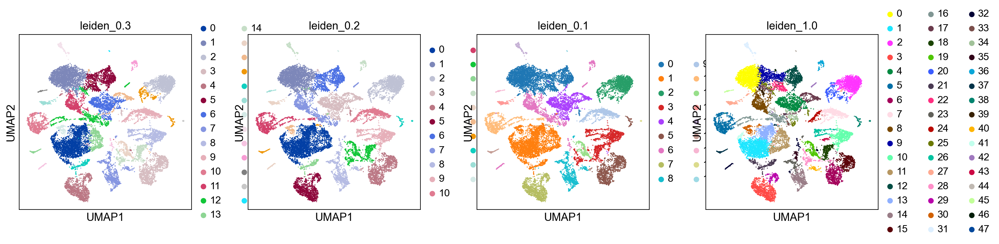

In [47]:
sc.pl.umap(adata, color=['leiden_0.3', 'leiden_0.2', 'leiden_0.1','leiden_1.0'])

In [48]:
adata

AnnData object with n_obs × n_vars = 17157 × 2789
    obs: 'type', 'sample', 'n_genes', 'batch', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'pct_counts_hb', 'percent_mt2', 'n_counts', 'leiden_1.0', 'leiden_0.3', 'leiden_0.2', 'leiden_0.1', 'leiden_0.01'
    var: 'gene_ids', 'feature_types', 'n_cells-0', 'n_cells-1', 'n_cells-2', 'n_cells-3', 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'type_colors', 'sample_colors', 'log1p', 'hvg', 'pca', 'neighbors', 'umap', 'leiden', 'leiden_0.3_colors', 'leiden_0.2_colors', 'leiden_0.1_colors', 'leiden_1.0_colors'
    obsm: 'X_pca', 'X_umap', 'leiden_0.3', 'leiden_0.2', 'leiden_0.1', 'leiden_0.01'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

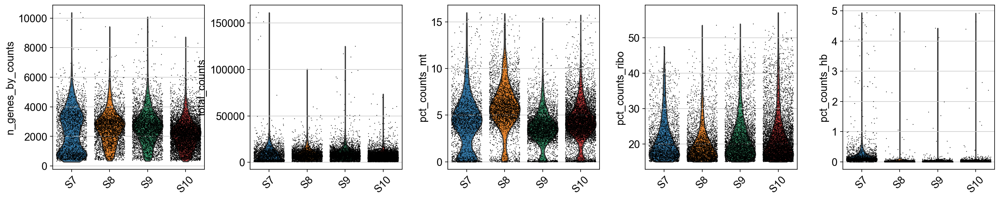

In [49]:
sc.pl.violin(adata, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt','pct_counts_ribo', 'pct_counts_hb'],
             jitter=0.4, groupby = 'type', rotation= 45)

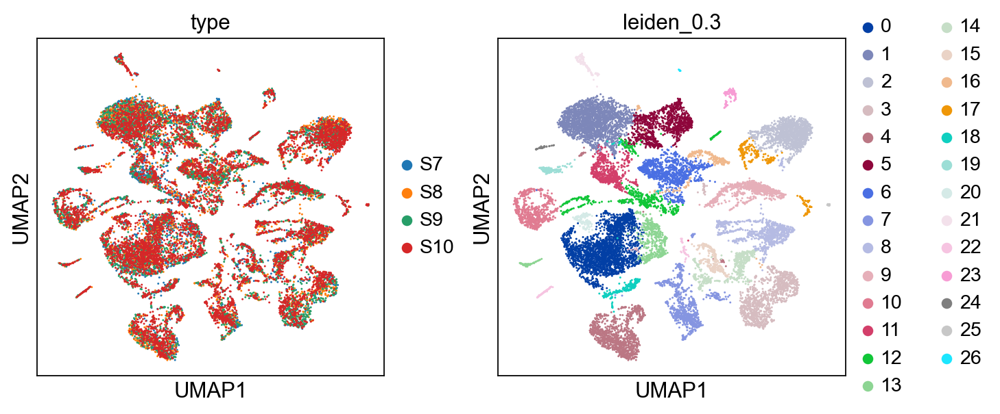

In [50]:
sc.pl.umap(adata,color = ("type","leiden_0.3"))

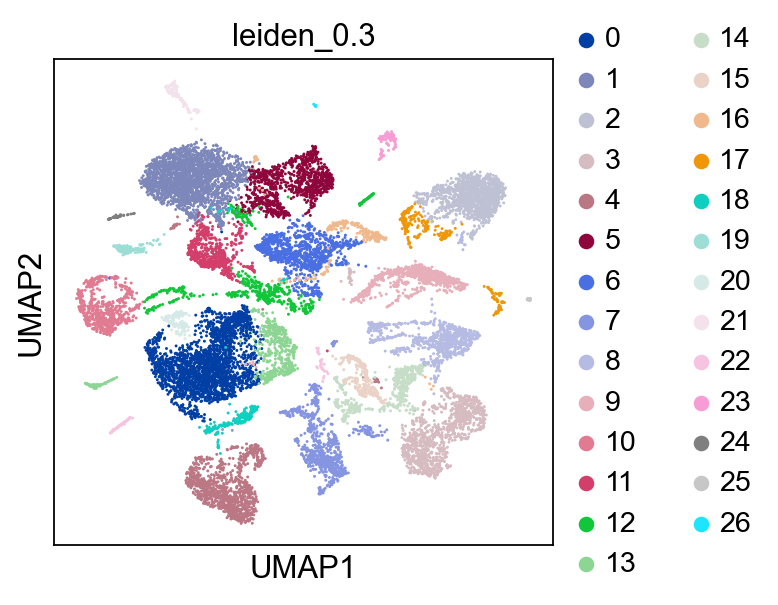

In [51]:
sc.pl.umap(adata,color = "leiden_0.3")

In [52]:
import numpy as np
import pandas as pd
import scanpy as sc
import gseapy
import matplotlib.pyplot as plt

sc.settings.verbosity = 2             # verbosity: errors (0), warnings (1), info (2), hints (3)
#sc.logging.print_versions()

In [53]:
sc.settings.set_figure_params(dpi=80)

In [54]:
print(adata.X.shape)
print(adata.raw.X.shape)
print(adata.raw.X[:10,:10])

(17157, 2789)
(17157, 18164)
  (0, 5)	2.8685405
  (1, 7)	0.5363904
  (1, 8)	0.88362205
  (1, 9)	0.88362205
  (2, 5)	1.0088568
  (2, 6)	1.0088568
  (2, 7)	1.5007224
  (2, 8)	1.5007224
  (3, 3)	2.3728223
  (4, 0)	0.5261623
  (4, 5)	0.5261623
  (4, 9)	1.4956249
  (5, 5)	0.7079437
  (5, 6)	0.93402046
  (5, 7)	0.93402046
  (5, 9)	0.7079437
  (6, 3)	1.5578979
  (6, 9)	1.055849
  (7, 3)	2.887122
  (7, 6)	0.6374563
  (7, 7)	0.6374563
  (7, 9)	1.0236466
  (8, 7)	2.596922
  (9, 3)	2.5085158


In [55]:
sc.tl.rank_genes_groups(adata,'leiden_0.3', method='t-test', key_added = "t-test")

ranking genes


/Users/sshome/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:394: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, 'names'] = self.var_names[global_indices]
/Users/sshome/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:396: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, 'scores'] = scores[global_indices]
/Users/sshome/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:399: PerformanceWarning: DataFrame i

    finished (0:00:04)


/Users/sshome/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:394: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, 'names'] = self.var_names[global_indices]
/Users/sshome/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:396: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, 'scores'] = scores[global_indices]
/Users/sshome/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:399: PerformanceWarning: DataFrame i

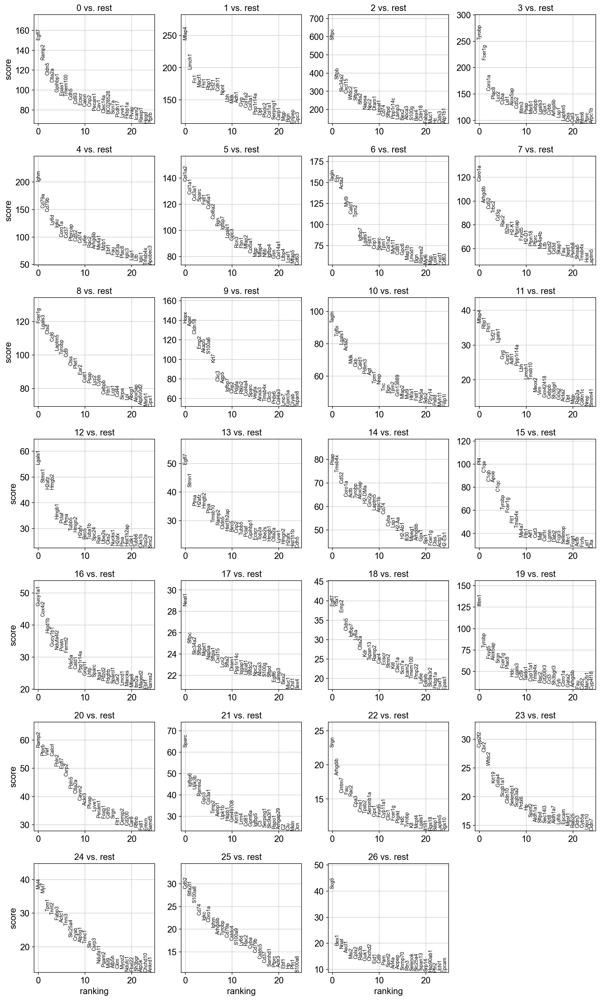

In [56]:
sc.pl.rank_genes_groups(adata, n_genes=25, sharey=False, key = "t-test")

ranking genes


/Users/sshome/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:394: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, 'names'] = self.var_names[global_indices]
/Users/sshome/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:396: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, 'scores'] = scores[global_indices]
/Users/sshome/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:399: PerformanceWarning: DataFrame i

    finished (0:00:22)


/Users/sshome/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:409: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, 'pvals_adj'] = pvals_adj[global_indices]
/Users/sshome/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/Users/sshome/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:394: PerformanceWarning: DataFrame is highl

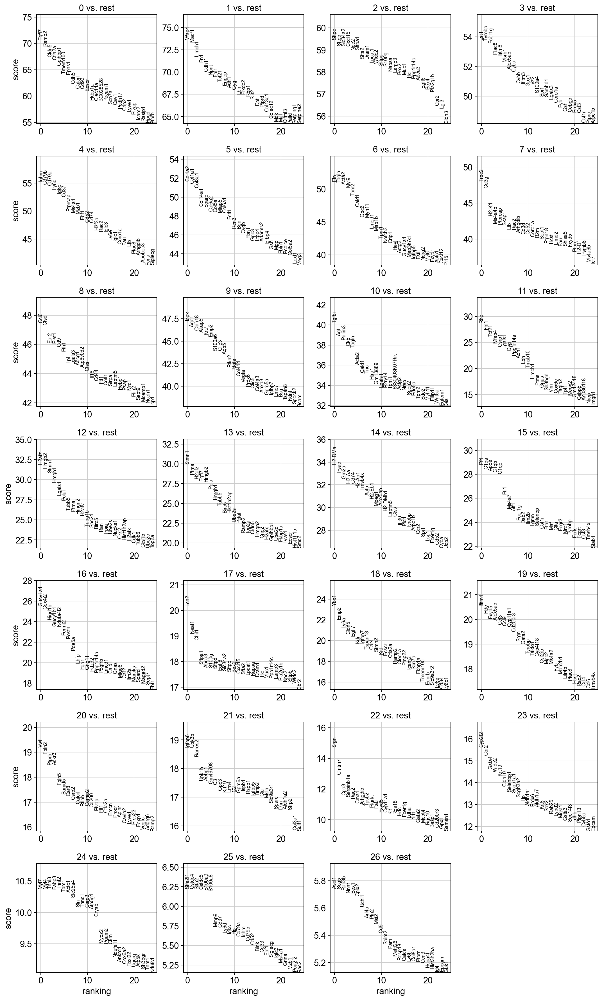

In [57]:
sc.tl.rank_genes_groups(adata,'leiden_0.3', method='wilcoxon', key_added = "wilcoxon",group = "type")
sc.pl.rank_genes_groups(adata, n_genes=25, sharey=False, key="wilcoxon")

ranking genes
    finished (0:01:33)


/Users/sshome/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


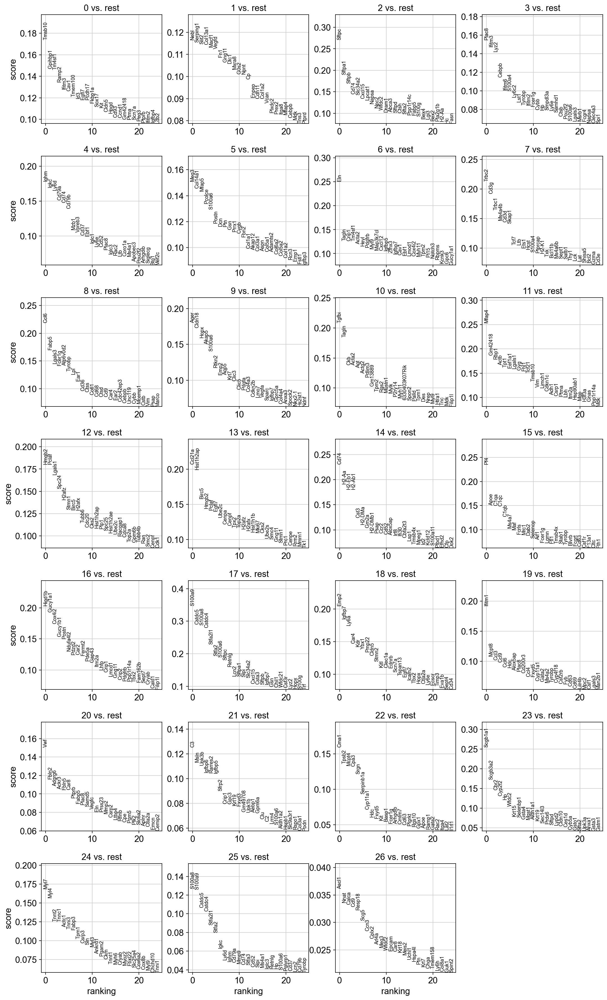

In [58]:
sc.tl.rank_genes_groups(adata,'leiden_0.3', method='logreg',key_added = "logreg")
sc.pl.rank_genes_groups(adata, n_genes=25, sharey=False, key = "logreg")

ranking genes


/Users/sshome/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:394: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, 'names'] = self.var_names[global_indices]
/Users/sshome/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:396: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, 'scores'] = scores[global_indices]
/Users/sshome/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:399: PerformanceWarning: DataFrame i

    finished (0:00:04)


/Users/sshome/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/Users/sshome/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:394: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, 'names'] = self.var_names[global_indices]
/Users/sshome/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:396: PerformanceWarning: DataFrame is high

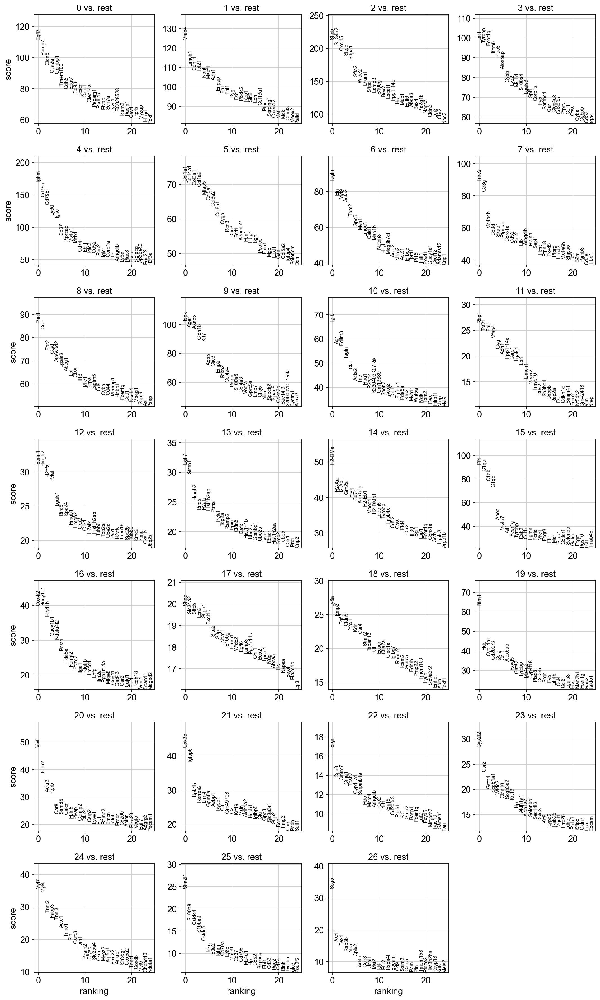

In [59]:
sc.tl.rank_genes_groups(adata,'leiden_0.3', method='t-test_overestim_var', key_added = "t-test_ov")
sc.pl.rank_genes_groups(adata, n_genes=25, sharey=False, key = "t-test_ov")

ranking genes
    finished (0:00:18)


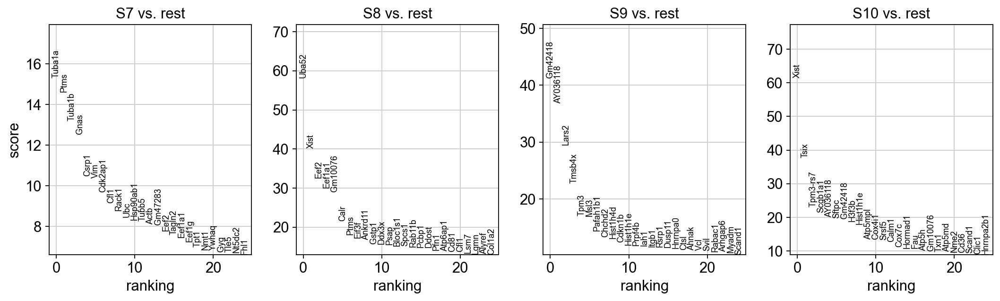

In [60]:
sc.tl.rank_genes_groups(adata,'type', method='wilcoxon', key_added = "wilcoxon")
sc.pl.rank_genes_groups(adata, n_genes=25, sharey=False, key="wilcoxon")

In [61]:
sc.tl.dendrogram(adata,'type')

    using 'X_pca' with n_pcs = 50
Storing dendrogram info using `.uns['dendrogram_type']`


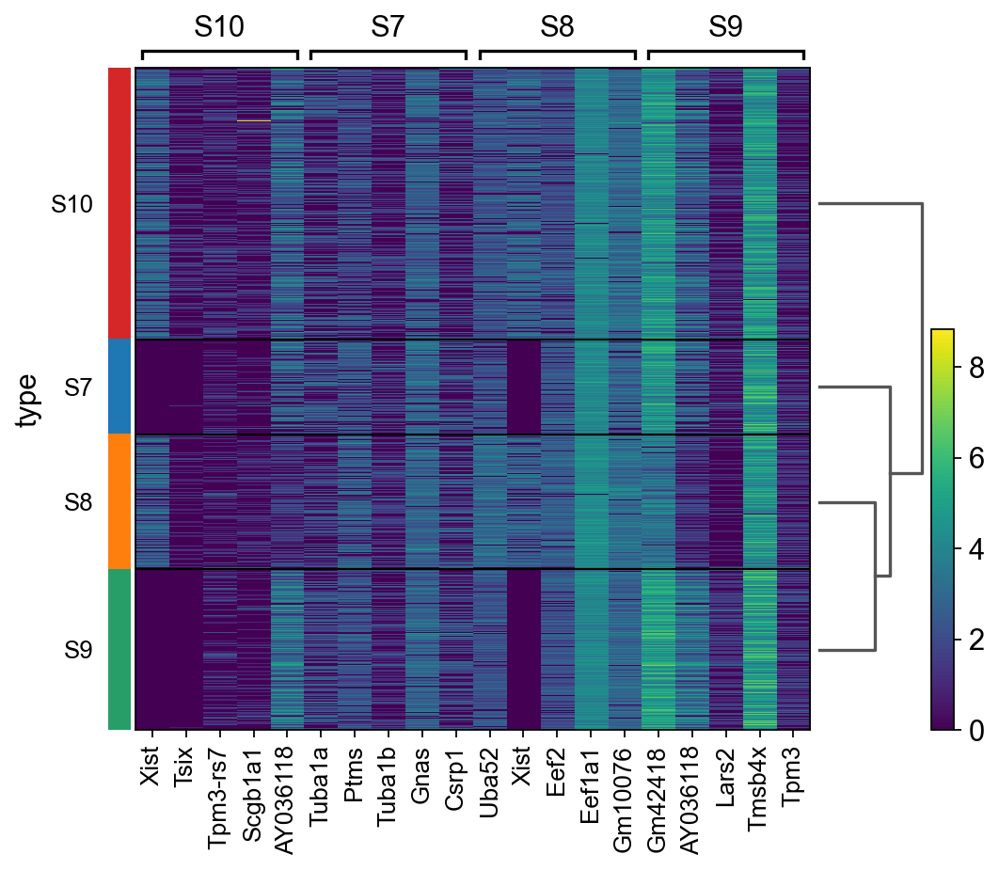

In [62]:
sc.pl.rank_genes_groups_heatmap(adata, n_genes=5, key="wilcoxon", groupby="type", show_gene_labels=True)

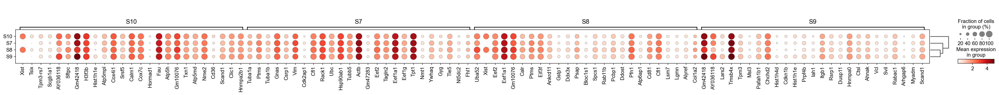

In [63]:
sc.pl.rank_genes_groups_dotplot(adata,n_genes=25,key="wilcoxon",groupby="type")

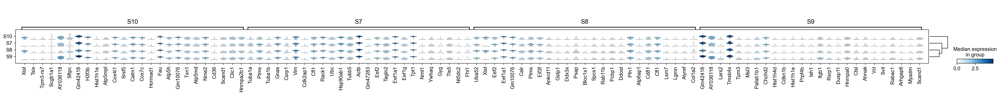

In [64]:
sc.pl.rank_genes_groups_stacked_violin(adata, n_genes=25, key="wilcoxon", groupby="type")

Matrix plot construction of DE genes based on Wilcoxon testing clustered based on Leiden clustering at 0.1 resolution.

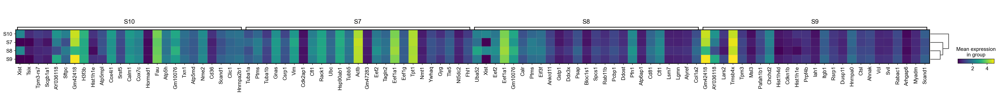

In [65]:
sc.pl.rank_genes_groups_matrixplot(adata, n_genes=25, key="wilcoxon", groupby="type")

ranking genes
    finished (0:00:05)


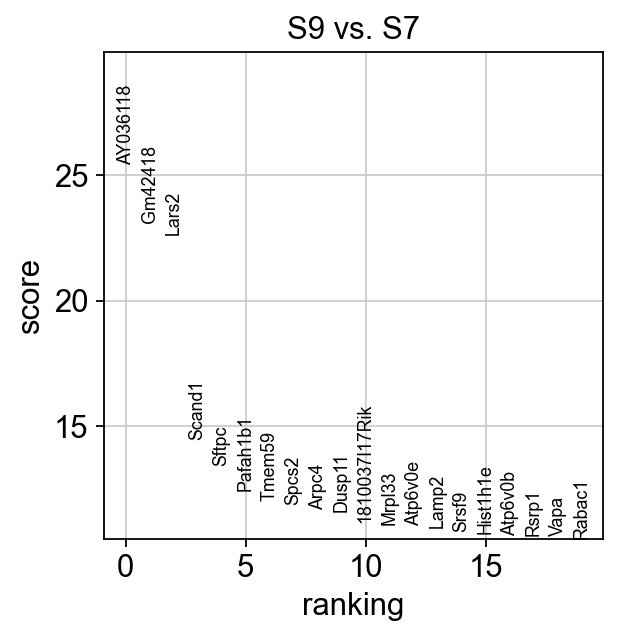

In [66]:
sc.tl.rank_genes_groups(adata,'type', groups=['S9'],reference='S7', method='wilcoxon')
sc.pl.rank_genes_groups(adata, groups=['S9'], n_genes=20)

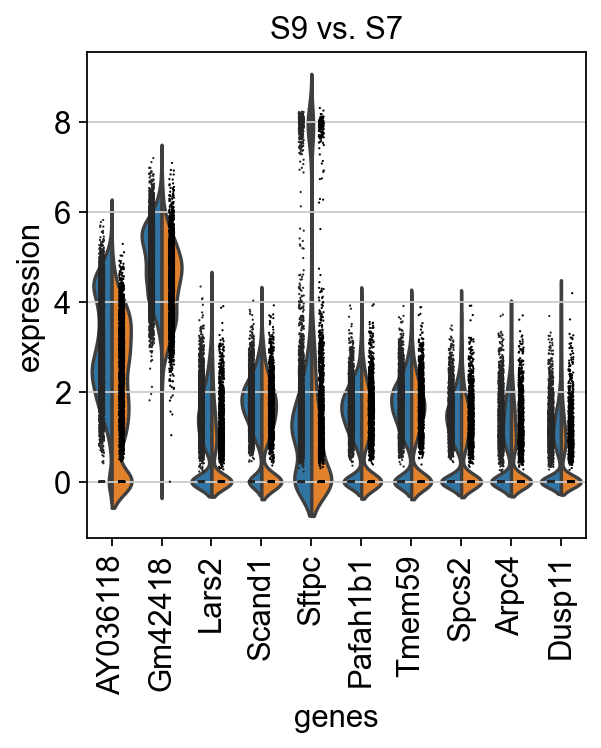

In [67]:
sc.pl.rank_genes_groups_violin(adata,groups='S9', n_genes=10)

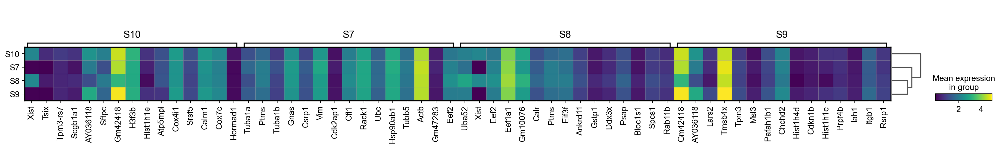

In [68]:
sc.pl.rank_genes_groups_matrixplot(adata, n_genes=15, key="wilcoxon", groupby="type")

ranking genes
    finished (0:00:05)


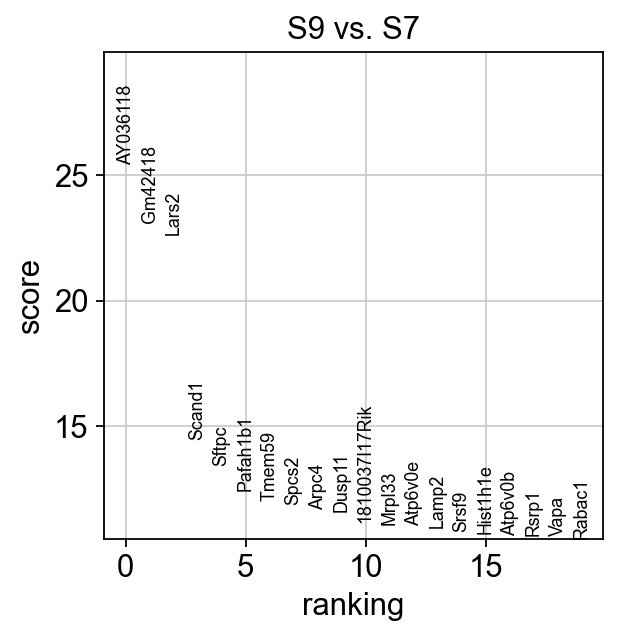

In [69]:
sc.tl.rank_genes_groups(adata,'type',groups=['S9'],reference='S7', method='wilcoxon')
sc.pl.rank_genes_groups(adata, groups=['S9'], n_genes=20)

ranking genes
    finished (0:00:09)


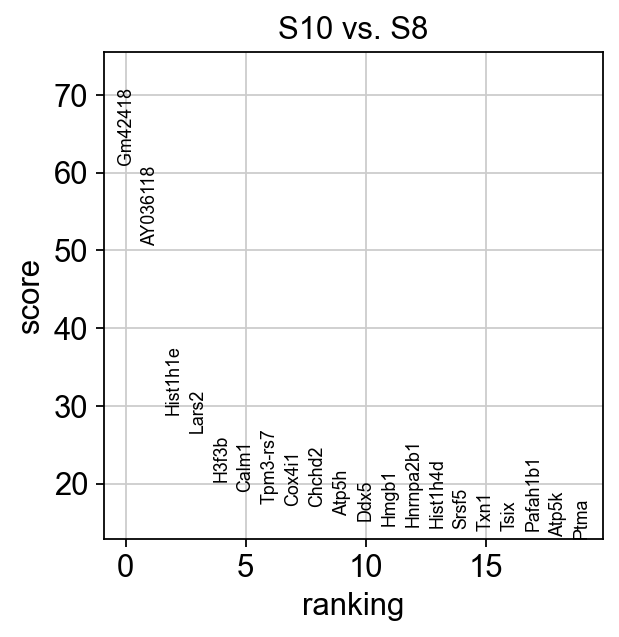

In [70]:
sc.tl.rank_genes_groups(adata,'type',groups=['S10'],reference='S8', method='wilcoxon')
sc.pl.rank_genes_groups(adata, groups=['S10'], n_genes=20)

In [71]:
#sc.pl.rank_genes_groups_violin(adata, groups='1', n_genes=10)

In [72]:
#cl1 = adata[adata.obs['leiden_0.1'] == '1',:]
adata.obs['type'].value_counts()

S10    7028
S9     4164
S8     3498
S7     2467
Name: type, dtype: int64

ranking genes
    finished (0:00:17)


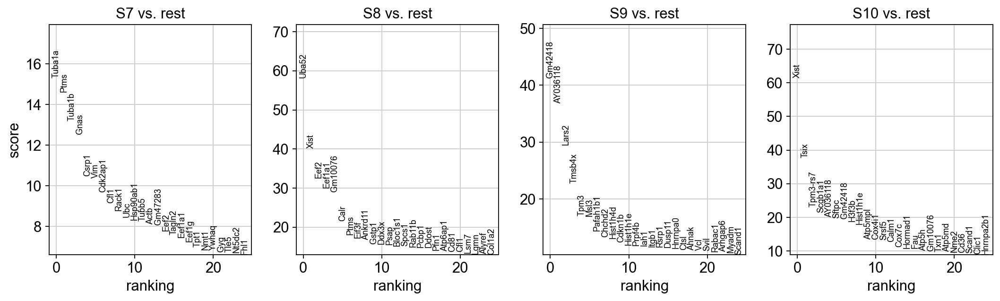

In [73]:
sc.tl.rank_genes_groups(adata,'type',method='wilcoxon', key_added = "wilcoxon")
sc.pl.rank_genes_groups(adata,n_genes=25, sharey=False, key="wilcoxon")

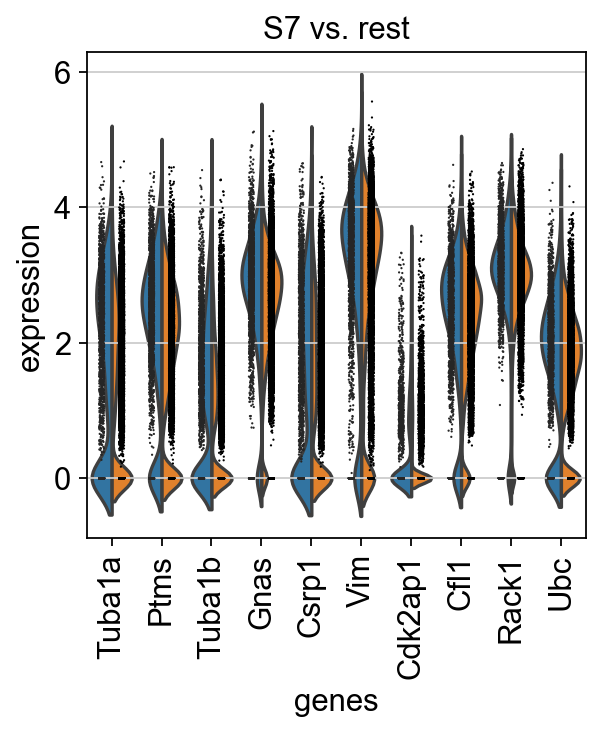

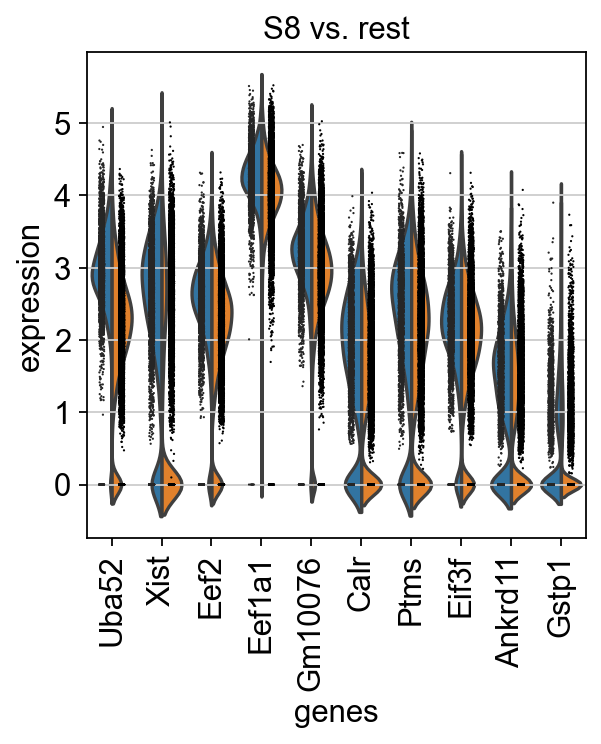

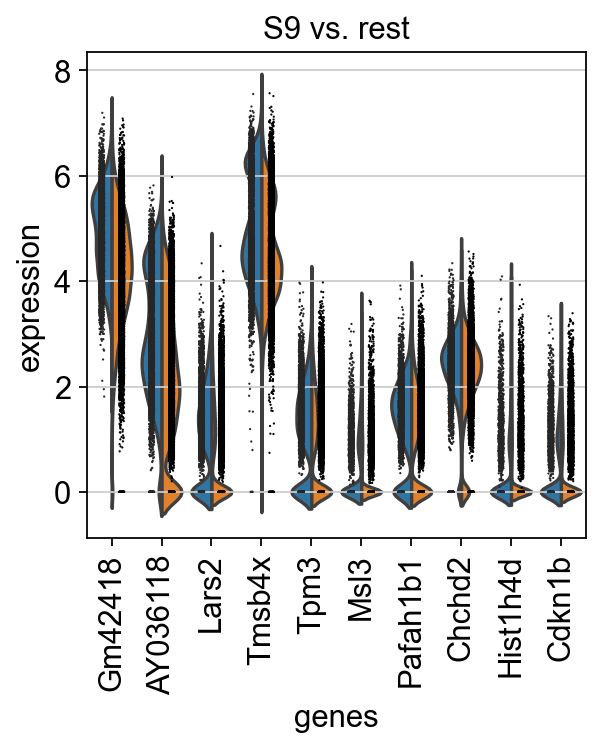

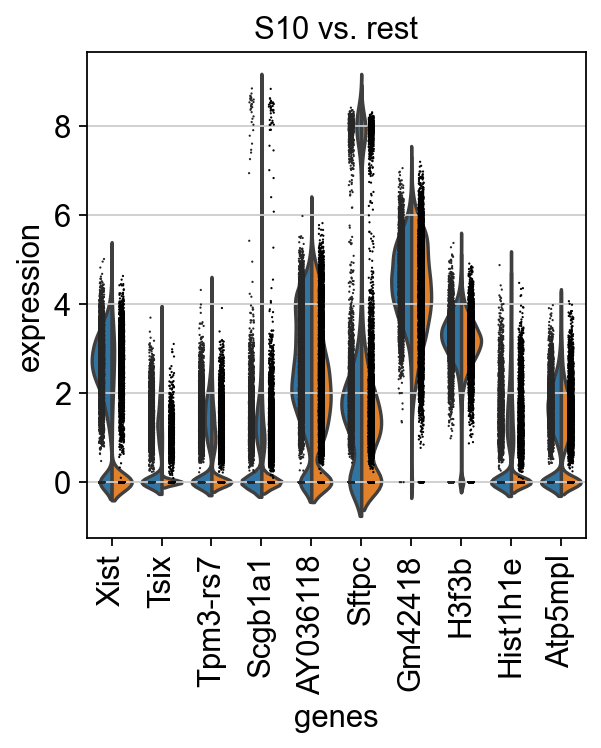

In [74]:
sc.pl.rank_genes_groups_violin(adata, n_genes=10, key="wilcoxon")

In [75]:
import gseapy

ranking genes
    finished (0:00:17)


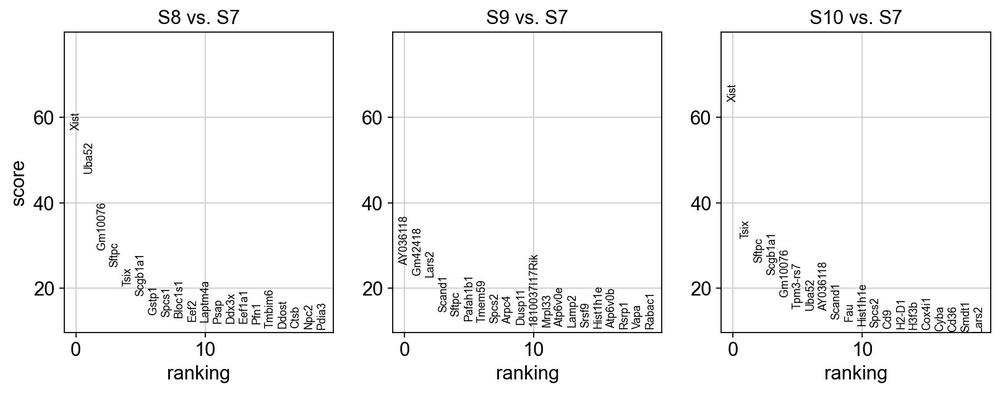

In [76]:
sc.tl.rank_genes_groups(adata,'type',groups=['S8','S9','S10'],reference='S7', method='wilcoxon')
sc.pl.rank_genes_groups(adata, groups=['S8','S9','S10'], n_genes=20)

In [77]:
#Available databases : ‘Human’, ‘Mouse’, ‘Yeast’, ‘Fly’, ‘Fish’, ‘Worm’ 
gene_set_names = gseapy.get_library_name(organism='Mouse')
print(gene_set_names)

['ARCHS4_Cell-lines', 'ARCHS4_IDG_Coexp', 'ARCHS4_Kinases_Coexp', 'ARCHS4_TFs_Coexp', 'ARCHS4_Tissues', 'Achilles_fitness_decrease', 'Achilles_fitness_increase', 'Aging_Perturbations_from_GEO_down', 'Aging_Perturbations_from_GEO_up', 'Allen_Brain_Atlas_10x_scRNA_2021', 'Allen_Brain_Atlas_down', 'Allen_Brain_Atlas_up', 'Azimuth_Cell_Types_2021', 'BioCarta_2013', 'BioCarta_2015', 'BioCarta_2016', 'BioPlanet_2019', 'BioPlex_2017', 'CCLE_Proteomics_2020', 'CORUM', 'COVID-19_Related_Gene_Sets', 'COVID-19_Related_Gene_Sets_2021', 'Cancer_Cell_Line_Encyclopedia', 'CellMarker_Augmented_2021', 'ChEA_2013', 'ChEA_2015', 'ChEA_2016', 'Chromosome_Location', 'Chromosome_Location_hg19', 'ClinVar_2019', 'DSigDB', 'Data_Acquisition_Method_Most_Popular_Genes', 'DepMap_WG_CRISPR_Screens_Broad_CellLines_2019', 'DepMap_WG_CRISPR_Screens_Sanger_CellLines_2019', 'Descartes_Cell_Types_and_Tissue_2021', 'DisGeNET', 'Disease_Perturbations_from_GEO_down', 'Disease_Perturbations_from_GEO_up', 'Disease_Signatures

ranking genes
    finished (0:00:05)


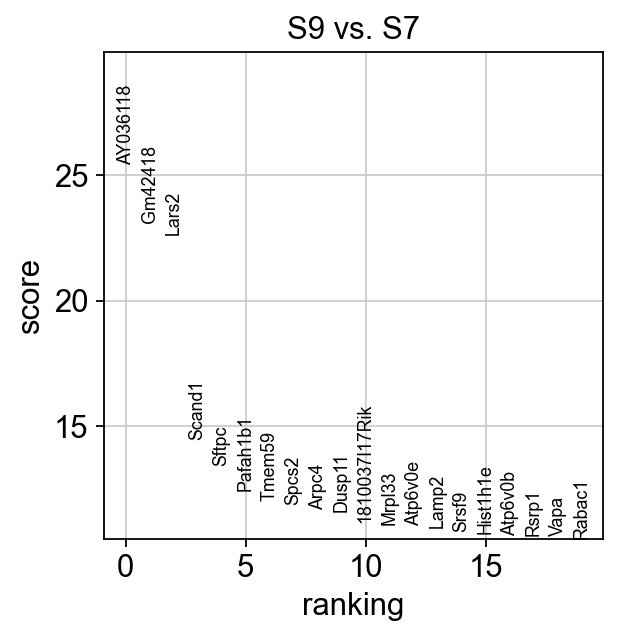

In [78]:
sc.tl.rank_genes_groups(adata,'type',groups=['S9'],reference='S7', method='wilcoxon')
sc.pl.rank_genes_groups(adata, groups=['S9'], n_genes=20)

ranking genes
    finished (0:00:09)


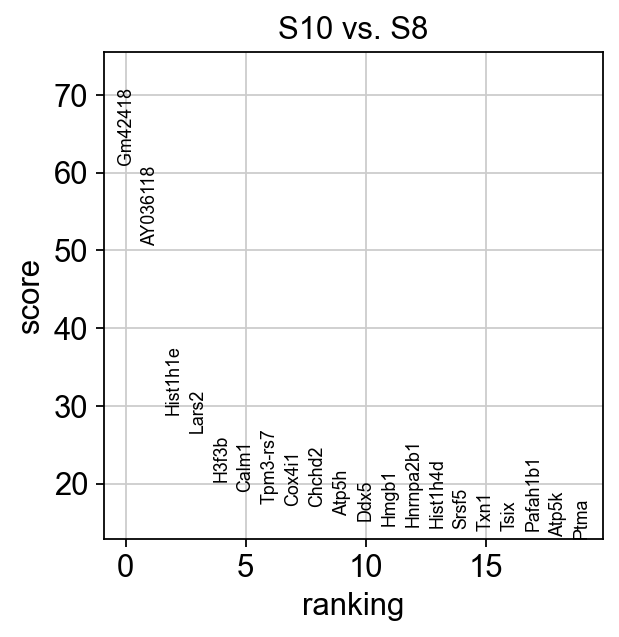

In [79]:
sc.tl.rank_genes_groups(adata,'type',groups=['S10'],reference='S8', method='wilcoxon')
sc.pl.rank_genes_groups(adata, groups=['S10'], n_genes=20)

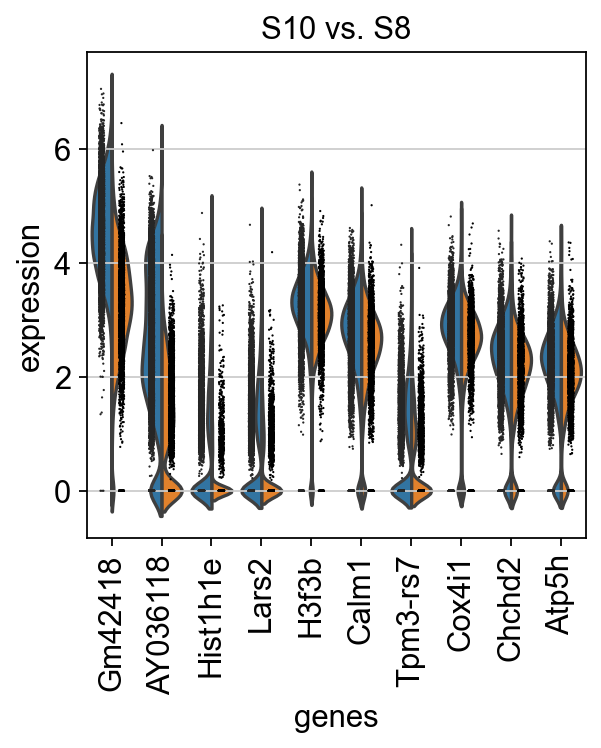

In [80]:
sc.pl.rank_genes_groups_violin(adata,groups=['S10'], n_genes=10)

In [81]:
sc.tl.rank_genes_groups(adata,'type',groups=['S9'],reference='S7', method='wilcoxon')

ranking genes
    finished (0:00:05)


In [82]:
gene_set_names = gseapy.get_library_name(organism='Mouse')
print(gene_set_names)

['ARCHS4_Cell-lines', 'ARCHS4_IDG_Coexp', 'ARCHS4_Kinases_Coexp', 'ARCHS4_TFs_Coexp', 'ARCHS4_Tissues', 'Achilles_fitness_decrease', 'Achilles_fitness_increase', 'Aging_Perturbations_from_GEO_down', 'Aging_Perturbations_from_GEO_up', 'Allen_Brain_Atlas_10x_scRNA_2021', 'Allen_Brain_Atlas_down', 'Allen_Brain_Atlas_up', 'Azimuth_Cell_Types_2021', 'BioCarta_2013', 'BioCarta_2015', 'BioCarta_2016', 'BioPlanet_2019', 'BioPlex_2017', 'CCLE_Proteomics_2020', 'CORUM', 'COVID-19_Related_Gene_Sets', 'COVID-19_Related_Gene_Sets_2021', 'Cancer_Cell_Line_Encyclopedia', 'CellMarker_Augmented_2021', 'ChEA_2013', 'ChEA_2015', 'ChEA_2016', 'Chromosome_Location', 'Chromosome_Location_hg19', 'ClinVar_2019', 'DSigDB', 'Data_Acquisition_Method_Most_Popular_Genes', 'DepMap_WG_CRISPR_Screens_Broad_CellLines_2019', 'DepMap_WG_CRISPR_Screens_Sanger_CellLines_2019', 'Descartes_Cell_Types_and_Tissue_2021', 'DisGeNET', 'Disease_Perturbations_from_GEO_down', 'Disease_Perturbations_from_GEO_up', 'Disease_Signatures

In [83]:
#?gseapy.enrichr
glist = sc.get.rank_genes_groups_df(adata, group=['S7','S9'], 
                                    key='wilcoxon', log2fc_min=0.25, 
                                    pval_cutoff=0.01)['names'].squeeze().str.strip().tolist()
print(len(glist))

1108


In [84]:
enr_res = gseapy.enrichr(gene_list=glist,
                     organism='Mouse',
                     gene_sets='GO_Biological_Process_2021',
                     description='pathway',
                     cutoff = 0.5)

/Users/sshome/opt/anaconda3/lib/python3.9/site-packages/gseapy/enrichr.py:427: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  self.results = self.results.append(res, ignore_index=True)


In [85]:
enr_res.results.head()

,Gene_set,Term,Overlap,P-value,Adjusted P-value,Old P-value,Old Adjusted P-value,Odds Ratio,Combined Score,Genes
0,GO_Biological_Process_2021,regulation of transmembrane receptor protein s...,12/31,3.844888e-08,0.000151,0,0,10.960333,187.136025,LATS1;TGFBR3;SMAD4;TWSG1;SMURF2;SOX11;NREP;FST...
1,GO_Biological_Process_2021,regulation of endothelial cell proliferation (...,19/92,4.963163e-07,0.000975,0,0,4.533005,65.801334,SEMA5A;ECM1;BMPR2;ANGPT1;CAV2;STAT1;WNT5A;F3;S...
2,GO_Biological_Process_2021,negative regulation of cellular process (GO:00...,60/566,8.525443e-07,0.001116,0,0,2.097218,29.308707,RB1;SEMA5A;BTG3;BTG2;IFITM1;CDKN1B;BMPR2;TGFB1...
3,GO_Biological_Process_2021,regulation of cell migration (GO:0030334),47/408,1.366011e-06,0.001341,0,0,2.292179,30.952709,SEMA5A;ITGB1;IFITM1;PDGFA;NEXN;PTPRJ;ADARB1;FO...
4,GO_Biological_Process_2021,regulation of transforming growth factor beta ...,19/100,1.890119e-06,0.001485,0,0,4.083565,53.816770,CDKN1C;SMAD4;CDKN2B;SMURF2;TGFB1I1;SOX11;NREP;...


In [86]:
enr_res.results

,Gene_set,Term,Overlap,P-value,Adjusted P-value,Old P-value,Old Adjusted P-value,Odds Ratio,Combined Score,Genes
0,GO_Biological_Process_2021,regulation of transmembrane receptor protein s...,12/31,3.844888e-08,0.000151,0,0,10.960333,187.136025,LATS1;TGFBR3;SMAD4;TWSG1;SMURF2;SOX11;NREP;FST...
1,GO_Biological_Process_2021,regulation of endothelial cell proliferation (...,19/92,4.963163e-07,0.000975,0,0,4.533005,65.801334,SEMA5A;ECM1;BMPR2;ANGPT1;CAV2;STAT1;WNT5A;F3;S...
2,GO_Biological_Process_2021,negative regulation of cellular process (GO:00...,60/566,8.525443e-07,0.001116,0,0,2.097218,29.308707,RB1;SEMA5A;BTG3;BTG2;IFITM1;CDKN1B;BMPR2;TGFB1...
3,GO_Biological_Process_2021,regulation of cell migration (GO:0030334),47/408,1.366011e-06,0.001341,0,0,2.292179,30.952709,SEMA5A;ITGB1;IFITM1;PDGFA;NEXN;PTPRJ;ADARB1;FO...
4,GO_Biological_Process_2021,regulation of transforming growth factor beta ...,19/100,1.890119e-06,0.001485,0,0,4.083565,53.816770,CDKN1C;SMAD4;CDKN2B;SMURF2;TGFB1I1;SOX11;NREP;...
...,...,...,...,...,...,...,...,...,...,...
3923,GO_Biological_Process_2021,sensory perception of chemical stimulus (GO:00...,1/99,9.963533e-01,0.997337,0,0,0.174574,0.000638,GNAS
3924,GO_Biological_Process_2021,potassium ion transmembrane transport (GO:0071...,2/139,9.965754e-01,0.997337,0,0,0.249465,0.000856,ATP1B1;PKD2
3925,GO_Biological_Process_2021,cellular amide metabolic process (GO:0043603),1/115,9.985306e-01,0.999012,0,0,0.149945,0.000220,ORMDL3
3926,GO_Biological_Process_2021,peptide biosynthetic process (GO:0043043),2/162,9.989377e-01,0.999012,0,0,0.213342,0.000227,MRPL9;MRPL24


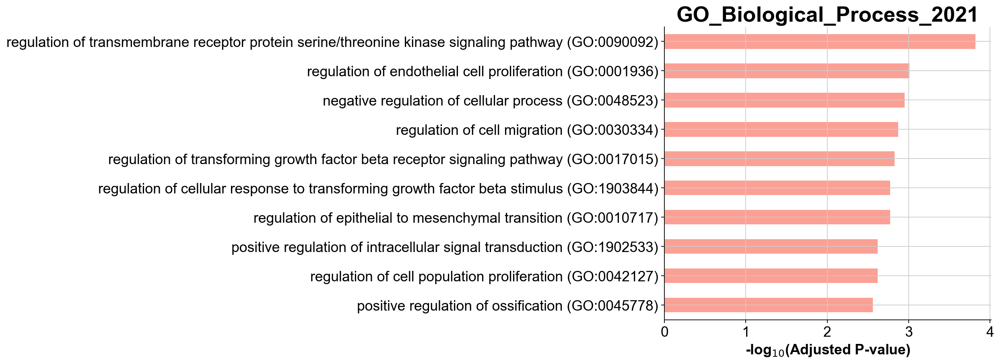

In [87]:
gseapy.barplot(enr_res.res2d,title='GO_Biological_Process_2021')

In [88]:
gene_rank = sc.get.rank_genes_groups_df(adata, group=['S7','S9'], key='wilcoxon')[['names','logfoldchanges']]
gene_rank.sort_values(by=['logfoldchanges'], inplace=True, ascending=False)

In [89]:
# calculate_qc_metrics will calculate number of cells per gene
sc.pp.calculate_qc_metrics(adata, percent_top=None, log1p=False, inplace=True)

# filter for genes expressed in at least 30 cells.
gene_rank = gene_rank[gene_rank['names'].isin(adata.var_names[adata.var.n_cells_by_counts>30])]

In [90]:
gene_rank

,names,logfoldchanges
18554,Gm43305,4.967672
438,Alas2,3.183873
25217,Rprml,2.899589
3332,Acta1,2.525433
683,Cyp1a1,1.873618
...,...,...
35444,Krt15,-2.335243
35102,Krt4,-2.355649
35263,Myoz2,-2.440694
33923,Krt13,-2.481144


In [91]:
gene_rank.to_csv('DE_Genes_BP_2021_S9_versus_S7_forfurther_analysis.csv')

In [92]:
enr_res.results.to_csv('GO_BP_2021_S9_versus_S7.csv')

In [93]:
#?gseapy.enrichr
glist = sc.get.rank_genes_groups_df(adata, group=['S8','S10'], 
                                    key='wilcoxon', log2fc_min=0.25, 
                                    pval_cutoff=0.01)['names'].squeeze().str.strip().tolist()
print(len(glist))

1997


In [94]:
enr_res = gseapy.enrichr(gene_list=glist,
                     organism='Mouse',
                     gene_sets='GO_Biological_Process_2021',
                     description='pathway',
                     cutoff = 0.5)

/Users/sshome/opt/anaconda3/lib/python3.9/site-packages/gseapy/enrichr.py:427: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  self.results = self.results.append(res, ignore_index=True)


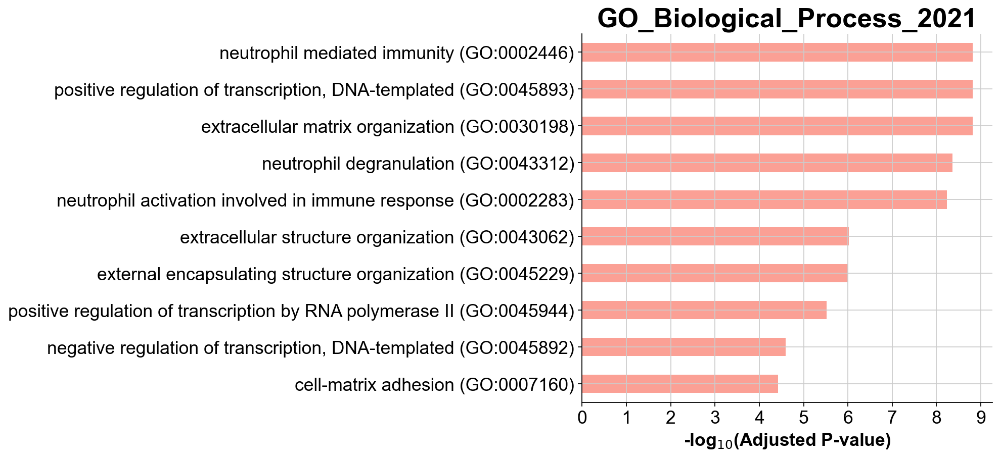

In [95]:
gseapy.barplot(enr_res.res2d,title='GO_Biological_Process_2021')

In [96]:
gene_rank = sc.get.rank_genes_groups_df(adata, group=['S8','S10'], key='wilcoxon')[['names','logfoldchanges']]
gene_rank.sort_values(by=['logfoldchanges'], inplace=True, ascending=False)

In [97]:
# calculate_qc_metrics will calculate number of cells per gene
sc.pp.calculate_qc_metrics(adata, percent_top=None, log1p=False, inplace=True)

# filter for genes expressed in at least 30 cells.
gene_rank = gene_rank[gene_rank['names'].isin(adata.var_names[adata.var.n_cells_by_counts>30])]

In [98]:
enr_res.results.to_csv('GO_BP_2021_S10_versus_S8.csv')

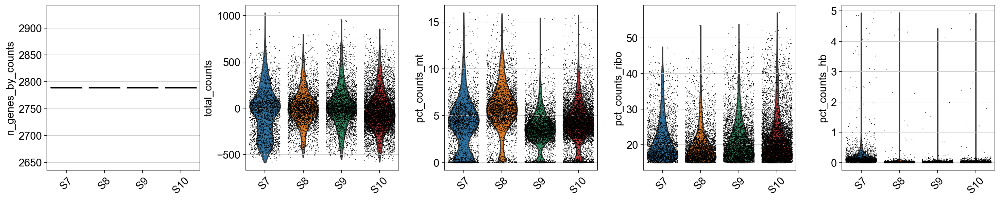

In [99]:
sc.pl.violin(adata, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt','pct_counts_ribo', 'pct_counts_hb'],
             jitter=0.4, groupby = 'type', rotation= 45)

In [100]:
gene_rank.to_csv('DE_Genes_BP_2021_S10_versus_S8_forfurther_analysis.csv')

In [101]:
adata

AnnData object with n_obs × n_vars = 17157 × 2789
    obs: 'type', 'sample', 'n_genes', 'batch', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'pct_counts_hb', 'percent_mt2', 'n_counts', 'leiden_1.0', 'leiden_0.3', 'leiden_0.2', 'leiden_0.1', 'leiden_0.01'
    var: 'gene_ids', 'feature_types', 'n_cells-0', 'n_cells-1', 'n_cells-2', 'n_cells-3', 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'type_colors', 'sample_colors', 'log1p', 'hvg', 'pca', 'neighbors', 'umap', 'leiden', 'leiden_0.3_colors', 'leiden_0.2_colors', 'leiden_0.1_colors', 'leiden_1.0_colors', 't-test', 'wilcoxon', 'logreg', 't-test_ov', 'dendrogram_type', 'rank_genes_groups'
    obsm: 'X_pca', 'X_umap', 'leiden_0.3', 'leiden_0.2', 'leiden_0.1', 'leiden_0.01'
    varm: 'PCs'
    obsp: 'distanc

In [102]:
print(adata.obs['type'].value_counts())

S10    7028
S9     4164
S8     3498
S7     2467
Name: type, dtype: int64


In [103]:
sc.pp.calculate_qc_metrics(adata, qc_vars=["mito"], inplace=True)

/Users/sshome/opt/anaconda3/lib/python3.9/site-packages/pandas/core/arraylike.py:397: RuntimeWarning: invalid value encountered in log1p
  result = getattr(ufunc, method)(*inputs, **kwargs)


KeyError: 'mito'

In [ ]:
adata